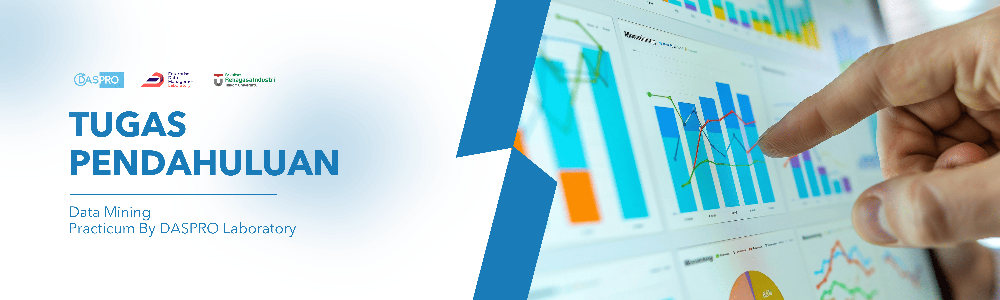

# **TUGAS PENDAHULUAN MODUL 1**



---


Nama: Renasya Cahya Handayani

NIM: 102022300290

Kelas: SI4704

Shift: 9

Kode Asprak: KYRA

## **Aturan Pengerjaan dan Pengumpulan Tugas Pendahuluan (TP):**


1. Tugas Pendahuluan dikerjakan secara individu dan diperbolehkan bertanya kepada asisten.
2. Jawaban tidak boleh sama dengan setiap individu.
3. File Python Notebook (.ipynb) yang berisi hasil kerja Tugas Pendahuluan harus diunggah pada modul yang telah disediakan di CeLOE Learning Management System (LMS).
4. Batas pengiriman Tugas Pendahuluan sesuai dengan batas waktu di CeLOE Learning Management System (LMS).
5. Format penamaan file .ipynb ( Python Notebook ):

    **Kode Asisten_TPX_NAMA LENGKAP (KAPITAL)_NIM.ipynb**


6. Tidak mengerjakan akan diberikan nilai 0.
7. Kesalahan format penamaan file praktikum akan mendapatkan potongan nilai sebesar 10%  per file yang salah.
8. Keterlambatan pengiriman file praktikum akan mendapatkan potongan nilai sebesar 50%.
9. Terbukti melakukan kecurangan melalui alat bantu AI (ChatGPT, GitHub Copilot, Dll) baik diluar atau didalam praktikum maka nilai modul = 0.
10. Segala bentuk atau indikasi kecurangan, mencontek, plagiarism, dan/atau pemalsuan akan dibawa ke Komisi Disiplin dan apabila terbukti nilai modul = 0.


## Studi Kasus

Dalam studi kasus ini, kita akan melakukan berbagai proses Data Cleansing, Data Reduction, Missing Value Handling, dan Data Transformation pada dataset yang berkaitan dengan harapan hidup. Dataset ini terdiri dari informasi mengenai faktor-faktor yang memengaruhi harapan hidup di 193 negara, termasuk imunisasi, angka kematian, faktor ekonomi, dan faktor sosial. Dataset ini sangat berguna untuk menganalisis hubungan antara variabel-variabel tersebut dan harapan hidup, serta memberikan wawasan bagi negara-negara dalam meningkatkan kesehatan populasi mereka.

### Dataset

Dataset ini terdiri dari 2938 baris dengan 22 kolom yang menjelaskan berbagai faktor harapan hidup di berbagai negara, seperti:

1. **Country**: Nama negara.  
2. **Year**: Tahun pengumpulan data.  
3. **Status**: Status negara (Maju atau Berkembang).  
4. **Life Expectancy**: Harapan hidup dalam tahun.  
5. **Adult Mortality**: Tingkat kematian orang dewasa (probabilitas meninggal antara usia 15 dan 60 per 1000 populasi).  
6. **Infant Deaths**: Jumlah kematian bayi per 1000 kelahiran hidup.  
7. **Alcohol**: Konsumsi alkohol per kapita (15+) dalam liter alkohol murni.  
8. **Percentage Expenditure**: Persentase pengeluaran kesehatan dibandingkan dengan PDB per kapita.  
9. **Hepatitis B Immunization Coverage**: Cakupan imunisasi Hepatitis B di antara anak berusia 1 tahun (%).  
10. **Measles**: Jumlah kasus campak yang dilaporkan per 1000 populasi.  
11. **BMI**: Indeks Massa Tubuh rata-rata populasi.  
12. **Under-Five Deaths**: Jumlah kematian anak di bawah lima tahun per 1000 populasi.  
13. **Polio Immunization Coverage**: Cakupan imunisasi Polio di antara anak berusia 1 tahun (%).  
14. **Total Expenditure**: Pengeluaran pemerintah untuk kesehatan sebagai persentase dari total pengeluaran pemerintah (%).  
15. **Diphtheria Immunization Coverage**: Cakupan imunisasi Diphteri, tetanus toksoid, dan pertussis di antara anak berusia 1 tahun (%).  
16. **HIV/AIDS**: Kematian per 1000 kelahiran hidup akibat HIV/AIDS (usia 0-4 tahun).  
17. **GDP**: Produk Domestik Bruto per kapita (dalam USD).  
18. **Population**: Jumlah populasi negara.  
19. **Thinness 1-19 years**: Prevalensi kekurangan berat badan pada anak-anak dan remaja usia 10 hingga 19 tahun (%).  
20. **Thinness 5-9 years**: Prevalensi kekurangan berat badan pada anak usia 5 hingga 9 tahun (%).  
21. **Income Composition of Resources**: Indeks Pembangunan Manusia berdasarkan komposisi pendapatan sumber daya (rentang 0 hingga 1).  
22. **Schooling**: Jumlah tahun pendidikan (dalam tahun).  

## Read Data

Pertama, kita akan membaca dataset menggunakan pandas dan menampilkan beberapa baris awal untuk memahami struktur data.

**Hint: library pandas, menggunkan read_csv(), head()**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

In [2]:
df = pd.read_csv("dataset_TP1.csv")
df.head()
# df.info()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## Data Cleansing

### Duplikasi data

mengecek apakah ada data yang duplikat dalam dataset. Jika ada data yang duplikat, kita menghapusnya karena data duplikat dapat mempengaruhi hasil analisis.

Cek data duplikasi

**Hint: duplicated(), dan sum()**

In [3]:
df.duplicated().sum()

np.int64(0)

Drop duplikasi data

**Hint: drop_duplicates()**

In [4]:
# tidak ada yang duplikat

Cek Keseluruhan data

**Hint: head()**

In [5]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


Berikan Kesimpulan: 
Dataset ini berisi informasi yang diambil dari 193 negara tentang faktor yang memengaruhi harapan hidup. Setelah melakukan "df.duplicated()", hasil yang keluar adalah "false" semua, menandakan dalam dataset ini tidak ada data yang duplikat.

### Data Null

Kolom **GDP** memiliki nilai yang hilang (missing values). Kita menghapus baris-baris yang mengandung nilai kosong, karena bisa memengaruhi kualitas model jika tidak ditangani.

Melihat info dari data

**Hint: info()**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

Cek null didalam data

**hint: isnull(), dan sum()**

In [7]:
df.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

Drop nilai null yang berada pada kolom **GDP**

**hint: dropna() dan subset**

In [8]:
df.dropna(subset = ['GDP'], inplace=True)

Cek hasil drop nilai null

**hint: insnull(), dan sum()**

In [9]:
df.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      5
Adult Mortality                      5
infant deaths                        0
Alcohol                            158
percentage expenditure               0
Hepatitis B                        476
Measles                              0
 BMI                                24
under-five deaths                    0
Polio                               11
Total expenditure                  158
Diphtheria                          11
 HIV/AIDS                            0
GDP                                  0
Population                         226
 thinness  1-19 years               24
 thinness 5-9 years                 24
Income composition of resources      6
Schooling                            3
dtype: int64

Berikan Kesimpulan:




### Drop kolom yang tidak di butuhkan

Beberapa kolom tidak relevan dengan analisis yang ingin kita lakukan, misalnya kolom **Population** yang mengandung banyak nilai null.

Cek Info dalam data

**Hint: info()**

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2490 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2490 non-null   object 
 1   Year                             2490 non-null   int64  
 2   Status                           2490 non-null   object 
 3   Life expectancy                  2485 non-null   float64
 4   Adult Mortality                  2485 non-null   float64
 5   infant deaths                    2490 non-null   int64  
 6   Alcohol                          2332 non-null   float64
 7   percentage expenditure           2490 non-null   float64
 8   Hepatitis B                      2014 non-null   float64
 9   Measles                          2490 non-null   int64  
 10   BMI                             2466 non-null   float64
 11  under-five deaths                2490 non-null   int64  
 12  Polio                    

Drop kolom yang tidak di butuhkan kolum **Population**

**Hint: drop()**

In [11]:
df=df.drop(columns=["Population"], axis=1)

Cek info dalam data

**Hint: info()**

In [12]:
df.info()
df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 2490 entries, 0 to 2937
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2490 non-null   object 
 1   Year                             2490 non-null   int64  
 2   Status                           2490 non-null   object 
 3   Life expectancy                  2485 non-null   float64
 4   Adult Mortality                  2485 non-null   float64
 5   infant deaths                    2490 non-null   int64  
 6   Alcohol                          2332 non-null   float64
 7   percentage expenditure           2490 non-null   float64
 8   Hepatitis B                      2014 non-null   float64
 9   Measles                          2490 non-null   int64  
 10   BMI                             2466 non-null   float64
 11  under-five deaths                2490 non-null   int64  
 12  Polio                    

Country                              0
Year                                 0
Status                               0
Life expectancy                      5
Adult Mortality                      5
infant deaths                        0
Alcohol                            158
percentage expenditure               0
Hepatitis B                        476
Measles                              0
 BMI                                24
under-five deaths                    0
Polio                               11
Total expenditure                  158
Diphtheria                          11
 HIV/AIDS                            0
GDP                                  0
 thinness  1-19 years               24
 thinness 5-9 years                 24
Income composition of resources      6
Schooling                            3
dtype: int64

Berikan Analisis/Kesimpulan: Kolom Population memiliki 652 nilai null. Meskipun berhubungan dengan Polio, populasi suatu negara tidak berdampak langsung pada harapan hidup. Oleh karena itu, menghapus kolom ini adalah keputusan yang tepat.

### Data Outlier

Outlier adalah data yang tidak lazim atau sangat berbeda dari data lainnya. Pada kasus ini, kita akan mendeteksi outlier pada semua kolom menggunakan metode Interquartile Range (IQR), dan menghapus data yang berada di luar batas.

Tampilkan ringkasan statistik dari data

**Hint: describe()**

In [13]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2490.000000,2485.000000,2485.000000,2490.000000,2332.000000,2490.000000,2014.000000,2490.000000,2466.000000,2490.000000,2479.000000,2332.000000,2479.000000,2490.000000,2490.000000,2466.000000,2466.000000,2484.000000,2487.000000
mean,2007.509237,69.370664,162.092153,31.272289,4.577813,871.077231,80.726415,2356.304819,38.426764,43.452209,82.519161,5.879074,82.493747,1.885703,7483.158469,4.832522,4.875223,0.631287,12.081705
std,4.604062,9.645918,126.276481,126.543014,4.025092,2132.451777,25.103306,11087.160526,19.972819,172.047216,23.275266,2.417168,23.453074,5.435971,14270.169342,4.499667,4.592109,0.213111,3.399877
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.400000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,71.000000,0.000000,0.857500,24.731816,77.000000,0.000000,19.200000,0.000000,78.000000,4.220000,79.000000,0.100000,463.935626,1.600000,1.600000,0.491000,10.100000
50%,2008.000000,72.200000,138.000000,3.000000,3.880000,121.534062,92.000000,15.000000,43.800000,3.000000,93.000000,5.740000,93.000000,0.100000,1766.947595,3.300000,3.300000,0.684000,12.400000
75%,2011.750000,76.000000,225.000000,20.000000,7.560000,574.150807,96.000000,351.750000,56.200000,25.000000,97.000000,7.532500,97.000000,0.800000,5910.806335,7.100000,7.100000,0.787000,14.500000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.240000,99.000000,50.600000,119172.741800,27.700000,28.600000,0.948000,20.700000


Buat grafik Boxplot semua colums Outlier

**Hint: library matplotlib, dan pandas**

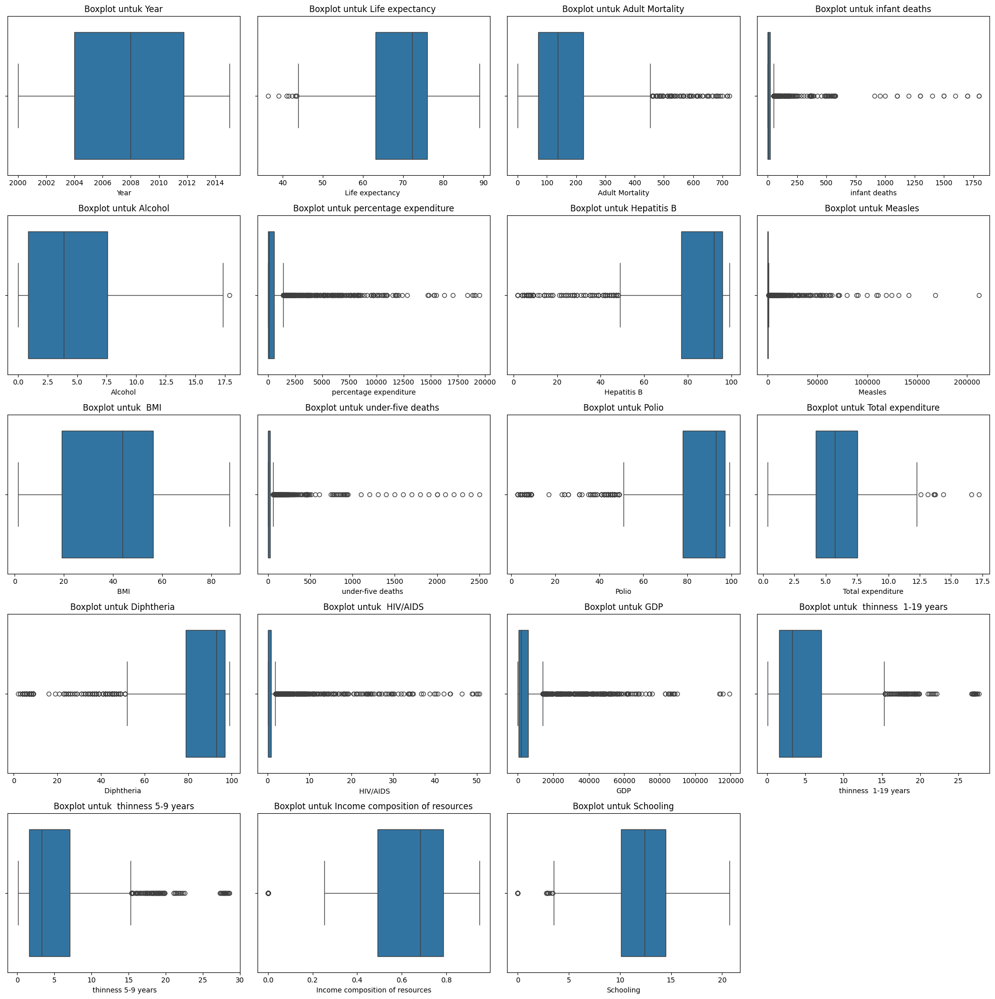

In [14]:
# df.dtypes
def display_boxplot():
  numerical_cols = df.select_dtypes(include=['number'])
  plt.figure(figsize=(20, 20))

  for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot untuk {col}")

  plt.tight_layout()
  plt.show()

display_boxplot()

Drop Data yang outlier

In [15]:

numerical_cols = df.select_dtypes(include=['number'])

outlier_index = []
for column in numerical_cols:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    outliers = df.index[(df[column] < (Q1 - 1.5 * IQR))| (df[column] > (Q3 + 1.5 * IQR))]

    print(f"{column} : {len(outliers)}")
    outlier_index.extend(outliers)

outlier_index = sorted(set(outlier_index))
print(outlier_index)
df=df.drop(index=outlier_index)


# numerical_cols = df.select_dtypes(include=['number'])

# outlier_index = []
# for column in numerical_cols:
#     Q1 = df[column].quantile(0.25)
#     Q3 = df[column].quantile(0.75)
#     IQR = Q3 - Q1

#     outliers = df.index[(df[column] < (Q1 - 1.5 * IQR))| (df[column] > (Q3 + 1.5 * IQR))]

#     print(f"{column} : {len(outliers)}")
#     print(outlier_index)
#     df=df.drop(index=outliers)

Year : 0
Life expectancy  : 8
Adult Mortality : 78
infant deaths : 297
Alcohol : 1
percentage expenditure : 340
Hepatitis B : 229
Measles  : 459
 BMI  : 0
under-five deaths  : 353
Polio : 235
Total expenditure : 8
Diphtheria  : 252
 HIV/AIDS : 469
GDP : 365
 thinness  1-19 years : 95
 thinness 5-9 years : 99
Income composition of resources : 112
Schooling : 28
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68, 69, 72, 74, 75, 76, 77, 78, 79, 84, 87, 104, 106, 107, 112, 113, 114, 115, 116, 117, 118, 119, 121, 124, 126, 127, 128, 129, 131, 132, 133, 134, 135, 136, 138, 139, 141, 142, 143, 149, 153, 154, 155, 156, 157, 176, 177, 179, 182, 186, 187, 188, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 220, 222, 232, 236, 239, 241, 247, 249, 250, 251, 253, 254, 255, 275, 278, 279, 280, 281, 282, 283,

In [16]:
df.info()
df.shape



<class 'pandas.core.frame.DataFrame'>
Index: 1029 entries, 16 to 2851
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          1029 non-null   object 
 1   Year                             1029 non-null   int64  
 2   Status                           1029 non-null   object 
 3   Life expectancy                  1026 non-null   float64
 4   Adult Mortality                  1026 non-null   float64
 5   infant deaths                    1029 non-null   int64  
 6   Alcohol                          944 non-null    float64
 7   percentage expenditure           1029 non-null   float64
 8   Hepatitis B                      914 non-null    float64
 9   Measles                          1029 non-null   int64  
 10   BMI                             1029 non-null   float64
 11  under-five deaths                1029 non-null   int64  
 12  Polio                   

(1029, 21)

Buat grafik Boxplot semua colums setelah pembersihan Outlier

**Hint: liblary matplotlib, dan pandas**

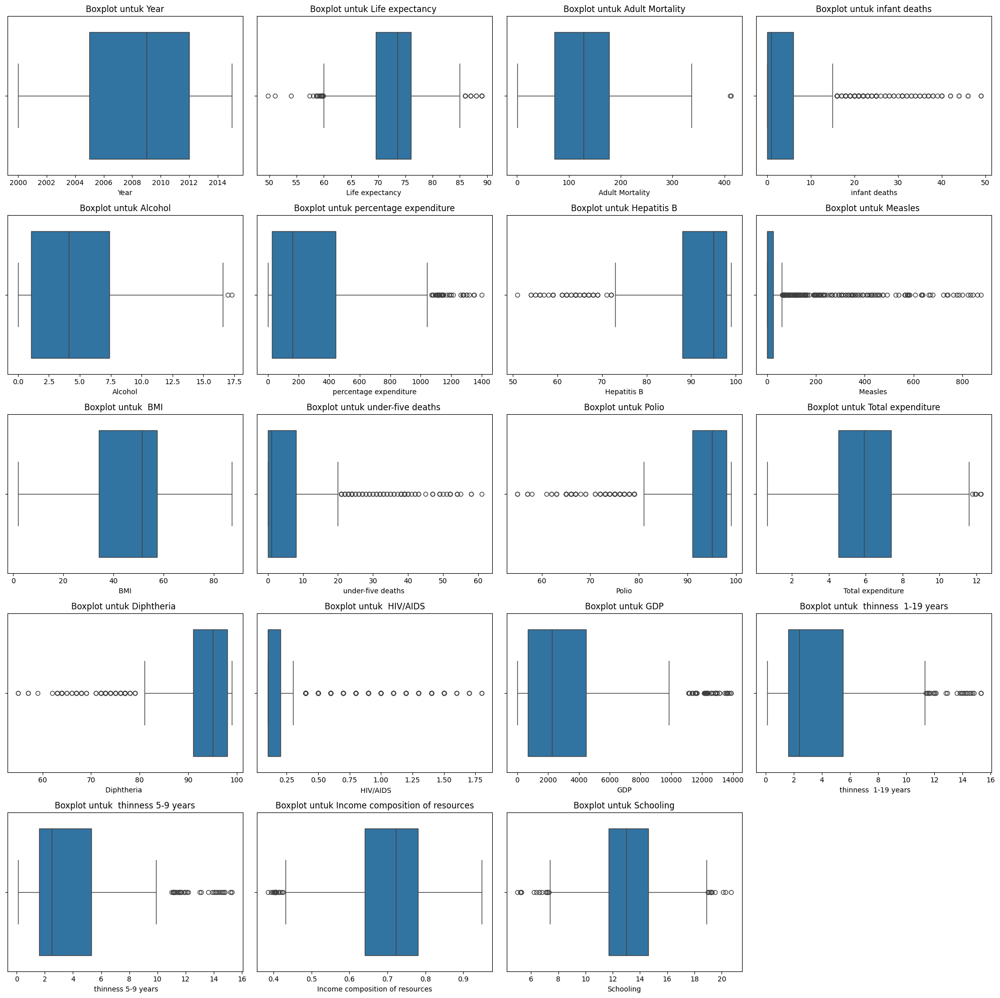

In [17]:
display_boxplot()

Cek info data

**Hint: info()**

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1029 entries, 16 to 2851
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          1029 non-null   object 
 1   Year                             1029 non-null   int64  
 2   Status                           1029 non-null   object 
 3   Life expectancy                  1026 non-null   float64
 4   Adult Mortality                  1026 non-null   float64
 5   infant deaths                    1029 non-null   int64  
 6   Alcohol                          944 non-null    float64
 7   percentage expenditure           1029 non-null   float64
 8   Hepatitis B                      914 non-null    float64
 9   Measles                          1029 non-null   int64  
 10   BMI                             1029 non-null   float64
 11  under-five deaths                1029 non-null   int64  
 12  Polio                   

Berikan Kesimpulan: Analisis outlier pada seluruh kolom numerik menemukan banyak outlier, terutama pada kolom HIV/AIDS. Outlier ini kemungkinan disebabkan oleh variasi tingkat prevalensi HIV/AIDS, akses layanan kesehatan, serta kebijakan penanganan di masing-masing negara. Setelah menghapus baris yang mengandung outlier, masih terdapat beberapa outlier yang tidak bisa dihapus tanpa mengurangi terlalu banyak data.

## Missing Value Handling

### Fill Missing Values by Mean

Pada kolom **Life expectancy, BMI, Schooling, Alcohol, Total expenditure,** kita mengisi nilai yang hilang dengan rata-rata dari kolom tersebut. Hal ini menghindari kehilangan data sambil tetap mempertahankan nilai yang representatif.

Cek nilai null

**Hint: isnull(), dan sum()**

In [19]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      3
Adult Mortality                      3
infant deaths                        0
Alcohol                             85
percentage expenditure               0
Hepatitis B                        115
Measles                              0
 BMI                                 0
under-five deaths                    0
Polio                                3
Total expenditure                   85
Diphtheria                           3
 HIV/AIDS                            0
GDP                                  0
 thinness  1-19 years                0
 thinness 5-9 years                  0
Income composition of resources      1
Schooling                            0
dtype: int64

Isi nilai null pada kolom **Life expectancy, BMI, Schooling, Alcohol, Total expenditure** dengan nilai mean

**Hint: fillna(), dan mean()**

In [20]:

df['Life expectancy '].fillna(df['Life expectancy '].mean(), inplace=True)
df[' BMI '].fillna(df[' BMI '].mean(), inplace=True)
df['Schooling'].fillna(df['Schooling'].mean(), inplace=True)
df['Alcohol'].fillna(df['Alcohol'].mean(), inplace=True)
df['Total expenditure'].fillna(df['Total expenditure'].mean(), inplace=True)



C:\Users\renas\AppData\Local\Temp\ipykernel_14544\303775389.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Life expectancy '].fillna(df['Life expectancy '].mean(), inplace=True)
C:\Users\renas\AppData\Local\Temp\ipykernel_14544\303775389.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always beh

Cek nilai null

**Hint: isnull(), dan sum()**

In [21]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      3
infant deaths                        0
Alcohol                              0
percentage expenditure               0
Hepatitis B                        115
Measles                              0
 BMI                                 0
under-five deaths                    0
Polio                                3
Total expenditure                    0
Diphtheria                           3
 HIV/AIDS                            0
GDP                                  0
 thinness  1-19 years                0
 thinness 5-9 years                  0
Income composition of resources      1
Schooling                            0
dtype: int64

Cek 10 data teratas

**Hint: menggunakan head()**

In [22]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,...,0,99.0,6.00,99.0,0.1,3954.227830,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,77.5,8.0,0,4.51,428.749067,98.0,0,...,1,98.0,5.88,98.0,0.1,4575.763787,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,77.2,84.0,0,4.76,430.876979,99.0,0,...,1,99.0,5.66,99.0,0.1,4414.723140,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,76.9,86.0,0,5.14,412.443356,99.0,9,...,1,99.0,5.59,99.0,0.1,4247.614380,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,76.6,88.0,0,5.37,437.062100,99.0,28,...,1,99.0,5.71,99.0,0.1,4437.178680,1.4,1.5,0.738,13.3


Berikan Kesimpulan: Analisis missing values menunjukkan bahwa kolom Hepatitis B memiliki 115 nilai kosong. Kolom lain yang memiliki nilai kosong adalah Alcohol dan Total expenditure (masing-masing 85), Life expectancy, Adult Mortality, Polio, dan Diphtheria (masing-masing 3), serta Income composition of resources (1). Penanganan pada Life expectancy, Alcohol, Total expenditure dilakukan dengan imputasi menggunakan mean. Sementara kolom lainnya akan di imputasi menggunakan median

### Fill Missing Values by Median

Pada kolom **"Adult Mortality", "percentage expenditure", "Measles", "under-five deaths",
                      "HIV/AIDS", "GDP", "thinness 1-19 years", "thinness 5-9 years",
                      "Hepatitis B", "Polio", "Diphtheria", "Income composition of resources"**, jika ada nilai yang hilang, kita mengisi dengan median karena median mempresentasikan nilai tengah dari masing masing kolom.

Cek nilai null

**Hint: isnull(), dan sum()**

In [23]:
df.isnull().sum()


Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      3
infant deaths                        0
Alcohol                              0
percentage expenditure               0
Hepatitis B                        115
Measles                              0
 BMI                                 0
under-five deaths                    0
Polio                                3
Total expenditure                    0
Diphtheria                           3
 HIV/AIDS                            0
GDP                                  0
 thinness  1-19 years                0
 thinness 5-9 years                  0
Income composition of resources      1
Schooling                            0
dtype: int64

Isi nilai null di kolum **"Adult Mortality", "percentage expenditure", "Measles", "under-five deaths",
                      "HIV/AIDS", "GDP", "thinness 1-19 years", "thinness 5-9 years",
                      "Hepatitis B", "Polio", "Diphtheria", "Income composition of resources"** dengan median

**Hint: fillna(), dan median()**

In [24]:

kolom = ["Adult Mortality", "percentage expenditure", "Measles ", "under-five deaths "," HIV/AIDS", "GDP", " thinness  1-19 years", " thinness 5-9 years","Hepatitis B", "Polio", "Diphtheria ", "Income composition of resources"]

def fill_pake_median(kolom):
    df[kolom].fillna(df[kolom].median(), inplace=True)
    
for i in kolom:
    fill_pake_median(i)

C:\Users\renas\AppData\Local\Temp\ipykernel_14544\1630961182.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[kolom].fillna(df[kolom].median(), inplace=True)
C:\Users\renas\AppData\Local\Temp\ipykernel_14544\1630961182.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For e

Cek nilai null

**Hint: isnull(), dan sum()**

In [25]:
df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

Tampilkan 10 data teratas

**Hint: head()**

In [26]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,...,0,99.0,6.00,99.0,0.1,3954.227830,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,77.5,8.0,0,4.51,428.749067,98.0,0,...,1,98.0,5.88,98.0,0.1,4575.763787,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,77.2,84.0,0,4.76,430.876979,99.0,0,...,1,99.0,5.66,99.0,0.1,4414.723140,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,76.9,86.0,0,5.14,412.443356,99.0,9,...,1,99.0,5.59,99.0,0.1,4247.614380,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,76.6,88.0,0,5.37,437.062100,99.0,28,...,1,99.0,5.71,99.0,0.1,4437.178680,1.4,1.5,0.738,13.3


Berikan Kesimpulan: Setelah dilakukan imputasi, seluruh nilai kosong telah terisi, dan dataset kini tidak memiliki missing values.

## Data Reduction

### PCA

PCA digunakan untuk mengurangi dimensi data tanpa kehilangan terlalu banyak informasi. Dalam kasus ini, kita menggunakan PCA untuk mengekstrak dua komponen utama dari data yang telah dinormalisasi.

note: untuk PCA tidak di gunakan pada tahap selanjutnya, harap gunakan df = df_PCA

Library yang digunakan

**Hint: sklearn.decomposite (PCA), numpy, sklearn.preprocessing (StandardScaler)**

In [27]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

df_PCA = df

memilih kolom numerik yang ingin di gunakan

**Hint: Menggunakan kolom "Life expectancy", "BMI", "GDP", "Schooling"**

In [28]:
principalDf = pd.DataFrame(data=df_PCA, columns=['Life expectancy ', ' BMI ', 'GDP', 'Schooling'])
principalDf.head(2)

,Life expectancy,BMI,GDP,Schooling
16,77.8,58.0,3954.227830,14.2
17,77.5,57.2,4575.763787,14.2


Normalisasikan data

**Hint: StandardScaler()**

In [29]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(principalDf) 

Menerapkan PCA untuk mengurangi dimensi

**Hint: dari 5 dimensi menjadi 2**

In [30]:
pca =PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)


Tampilkan data sebelum dan data setelah pengimplementasian PCA

**Hint: menggunakan 5 baris pertama [:5]**

In [31]:
print(df_scaled[:5])
print()
print(X_pca[:5])

[[0.8849179  0.72498711 0.25246322 0.47486635]
 [0.83064317 0.6811759  0.45126274 0.47486635]
 [0.77636844 0.6428411  0.39975357 0.47486635]
 [0.72209372 0.60450629 0.34630349 0.47486635]
 [0.66781899 0.56617149 0.40693602 0.08994405]]

[[ 1.19220928 -0.27513533]
 [ 1.21700995 -0.06790233]
 [ 1.15025442 -0.08836429]
 [ 1.08277033 -0.11057671]
 [ 0.8308119   0.00536448]]


Berikan Kesimpulan: Setelah menerapkan PCA dengan mengurangi dimensi dari 5 menjadi 2, data berhasil direduksi tanpa kehilangan terlalu banyak informasi. Data yang sebelumnya memiliki 5 fitur kini direpresentasikan dalam 2 dimensi utama, yang tetap mempertahankan karakteristik penting dari dataset. Hasil transformasi menunjukkan perubahan skala data, yang dapat digunakan untuk analisis lebih lanjut seperti clustering atau visualisasi.

### Sampling

Pengambilan sampel berguna untuk mempercepat proses analisis jika dataset terlalu besar. Kita mengambil sejumlah sampel acak dari dataset untuk dianalisis lebih lanjut.

Melihat info dari data

**Hint: info()**

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1029 entries, 16 to 2851
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          1029 non-null   object 
 1   Year                             1029 non-null   int64  
 2   Status                           1029 non-null   object 
 3   Life expectancy                  1029 non-null   float64
 4   Adult Mortality                  1029 non-null   float64
 5   infant deaths                    1029 non-null   int64  
 6   Alcohol                          1029 non-null   float64
 7   percentage expenditure           1029 non-null   float64
 8   Hepatitis B                      1029 non-null   float64
 9   Measles                          1029 non-null   int64  
 10   BMI                             1029 non-null   float64
 11  under-five deaths                1029 non-null   int64  
 12  Polio                   

Mengambil data sample

**Hint: sample 80%, dan menggunakan random_states=1**

In [33]:
df_sampling = df.sample(frac=0.8, random_state=1)

Melihat info dari data

**Hint: info()**

In [34]:
df_sampling.info()

<class 'pandas.core.frame.DataFrame'>
Index: 823 entries, 986 to 1317
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          823 non-null    object 
 1   Year                             823 non-null    int64  
 2   Status                           823 non-null    object 
 3   Life expectancy                  823 non-null    float64
 4   Adult Mortality                  823 non-null    float64
 5   infant deaths                    823 non-null    int64  
 6   Alcohol                          823 non-null    float64
 7   percentage expenditure           823 non-null    float64
 8   Hepatitis B                      823 non-null    float64
 9   Measles                          823 non-null    int64  
 10   BMI                             823 non-null    float64
 11  under-five deaths                823 non-null    int64  
 12  Polio                   

Berikan Kesimpulan: Setelah melakukan sampling dengan mengambil 80% data menggunakan random_state=1, diperoleh 823 sampel dari dataset asli. Struktur data tetap sama dengan 21 kolom,memungkinkan analisis lebih efisien tanpa kehilangan karakteristik utama dataset.

## Data Transformation

### Normalization (Min-Max Scaling)

Untuk kolom-kolom numerik seperti **Life expectancy dan GDP**, kita menerapkan normalisasi sehingga nilainya berada di rentang 0 hingga 1. Ini penting dalam banyak model machine learning yang sensitif terhadap skala data.

Melihat data teratas

**Hint: head()**

In [35]:
df_sampling.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
986,Georgia,2007,Developing,74.4,12.0,1,8.65,106.164686,94.0,44,...,1,88.0,8.17,98.0,0.1,2492.128780,2.7,2.9,0.722,12.5
666,Cuba,2006,Developing,78.0,14.0,1,4.17,523.472428,89.0,0,...,1,99.0,7.67,89.0,0.1,4669.691600,3.4,3.2,0.732,14.7
2294,Seychelles,2002,Developing,72.1,186.0,0,11.15,562.360185,99.0,0,...,0,99.0,4.21,99.0,0.1,8331.261997,6.1,6.6,0.712,12.1
1640,Malta,2009,Developed,82.0,63.0,0,7.38,335.518057,86.0,1,...,0,73.0,8.33,73.0,0.1,2675.582590,0.8,0.7,0.815,14.4
2570,Thailand,2014,Developing,74.6,152.0,8,6.41,789.077295,99.0,0,...,10,99.0,4.12,99.0,0.1,5941.847100,7.8,7.8,0.737,13.6


Import library

**Hint: sklearn.preprocessing (MinMaxScaler)**

In [36]:
from sklearn.preprocessing import MinMaxScaler

Normalisasikan data pada kolum **Life expectancy** dan **GDP**

**Hint: fit_transform()**

In [37]:
scaler = MinMaxScaler()
df[['Life expectancy ', 'GDP']] = scaler.fit_transform(df[['Life expectancy ', 'GDP']])

Berikan Kesimpulan: Setelah melakukan normalisasi menggunakan MinMaxScaler, nilai pada kolom Life expectancy dan GDP diubah ke skala antara 0 hingga 1. Normalisasi ini bertujuan untuk menyamakan skala antar fitur sehingga algoritma machine learning dapat bekerja lebih optimal.

### Discretization (Binning)

Kolom seperti **Life expentancy** dibagi menjadi beberapa kategori (rendah, sedang, tinggi) untuk tujuan klasifikasi.

Tampilkan data teratas

**Hint: head()**

In [38]:
df['Life expectancy '].value_counts()
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,0.715013,74.0,0,4.60,364.975229,99.0,0,...,0,99.0,6.00,99.0,0.1,0.284185,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,0.707379,8.0,0,4.51,428.749067,98.0,0,...,1,98.0,5.88,98.0,0.1,0.328948,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,0.699746,84.0,0,4.76,430.876979,99.0,0,...,1,99.0,5.66,99.0,0.1,0.317350,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,0.692112,86.0,0,5.14,412.443356,99.0,9,...,1,99.0,5.59,99.0,0.1,0.305315,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,0.684478,88.0,0,5.37,437.062100,99.0,28,...,1,99.0,5.71,99.0,0.1,0.318967,1.4,1.5,0.738,13.3


Normalisasikan data kolom **Life expentancy**

**Hint: bins=3, dan labelnya ada rendah, sedang, tinggi**

In [39]:
labels = ['Rendah', 'Sedang', 'Tinggi']
bins = 3
df['Life expectancy '] = pd.qcut(df['Life expectancy '], q=bins, labels=labels)

df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,Tinggi,74.0,0,4.60,364.975229,99.0,0,...,0,99.0,6.00,99.0,0.1,0.284185,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,Tinggi,8.0,0,4.51,428.749067,98.0,0,...,1,98.0,5.88,98.0,0.1,0.328948,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,Tinggi,84.0,0,4.76,430.876979,99.0,0,...,1,99.0,5.66,99.0,0.1,0.317350,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,Tinggi,86.0,0,5.14,412.443356,99.0,9,...,1,99.0,5.59,99.0,0.1,0.305315,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,Tinggi,88.0,0,5.37,437.062100,99.0,28,...,1,99.0,5.71,99.0,0.1,0.318967,1.4,1.5,0.738,13.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2846,Vanuatu,2011,Developing,Rendah,141.0,0,0.85,457.973174,63.0,0,...,0,65.0,3.85,65.0,0.1,0.235332,1.5,1.4,0.591,10.8
2847,Vanuatu,2010,Developing,Rendah,145.0,0,0.91,471.862653,62.0,0,...,0,66.0,4.71,65.0,0.1,0.212999,1.5,1.4,0.590,10.8
2848,Vanuatu,2009,Developing,Tinggi,149.0,0,0.83,361.094098,62.0,0,...,0,66.0,3.90,66.0,0.1,0.189780,1.5,1.5,0.589,10.7
2849,Vanuatu,2008,Developing,Tinggi,153.0,0,1.18,345.339056,61.0,0,...,0,66.0,3.66,67.0,0.1,0.193707,1.5,1.5,0.582,10.7


Tampilkan data teratas

**Hint: head()**

In [40]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,Tinggi,74.0,0,4.60,364.975229,99.0,0,...,0,99.0,6.00,99.0,0.1,0.284185,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,Tinggi,8.0,0,4.51,428.749067,98.0,0,...,1,98.0,5.88,98.0,0.1,0.328948,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,Tinggi,84.0,0,4.76,430.876979,99.0,0,...,1,99.0,5.66,99.0,0.1,0.317350,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,Tinggi,86.0,0,5.14,412.443356,99.0,9,...,1,99.0,5.59,99.0,0.1,0.305315,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,Tinggi,88.0,0,5.37,437.062100,99.0,28,...,1,99.0,5.71,99.0,0.1,0.318967,1.4,1.5,0.738,13.3


Berikan Kesimpulan: Kolom Life expectancy dibagi menjadi tiga kategori: Rendah, Sedang, dan Tinggi menggunakan metode quantile binning (pd.qcut()). Dengan transformasi ini, nilai numerik dalam kolom Life expectancy digantikan dengan label kategori.

### One-Hot Encoding

Kolom kategori seperti **status** diubah menjadi format numerik menggunakan One-Hot Encoding. Ini membantu model machine learning untuk memahami variabel kategori.

Melihat data teratas

**Hint: head()**

In [41]:
df['Status'].value_counts()

Status
Developing    838
Developed     191
Name: count, dtype: int64

In [42]:
df['Status'] = df['Status'].map({
    'Developing':0, 
    'Developed ':1
})


Normalisasikan dengan One-Hot Encoding

**Hint: get_dummies(), dan kolum yang di gunakan status**

In [43]:
df = pd.get_dummies(df, columns=['Status'])

Tampilkan data teratas

**Hint: head()**

In [44]:
df.head()
# df['Status_0.0'].value_counts()

,Country,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_0.0
16,Albania,2015,Tinggi,74.0,0,4.60,364.975229,99.0,0,58.0,...,99.0,6.00,99.0,0.1,0.284185,1.2,1.3,0.762,14.2,True
17,Albania,2014,Tinggi,8.0,0,4.51,428.749067,98.0,0,57.2,...,98.0,5.88,98.0,0.1,0.328948,1.2,1.3,0.761,14.2,True
18,Albania,2013,Tinggi,84.0,0,4.76,430.876979,99.0,0,56.5,...,99.0,5.66,99.0,0.1,0.317350,1.3,1.4,0.759,14.2,True
19,Albania,2012,Tinggi,86.0,0,5.14,412.443356,99.0,9,55.8,...,99.0,5.59,99.0,0.1,0.305315,1.3,1.4,0.752,14.2,True
20,Albania,2011,Tinggi,88.0,0,5.37,437.062100,99.0,28,55.1,...,99.0,5.71,99.0,0.1,0.318967,1.4,1.5,0.738,13.3,True


Berikan Kesimpulan: kolom Status yang awalnya memiliki dua kategori, yaitu Developing dan Developed, dikonversi menjadi nilai numerik menggunakan metode mapping. Kategori Developing diberikan nilai 0, sedangkan Developed diberikan nilai 1. Proses ini memungkinkan algoritma machine learning untuk memahami data kategori dalam bentuk numerik tanpa kehilangan informasi dari kategori tersebut.